---
> Dados: [Insects Recognition](https://www.kaggle.com/datasets/hammaadali/insects-recognition)

> Notebook desenvolvido por: [Larissa Rosa](https://br.linkedin.com/in/larissa-rosa-82736b215)
---

<a target="_blank" href="https://colab.research.google.com/drive/1slwiKuj9oPdvHYiP-ZAPEat4YCbDFLZu?usp=drive_link">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

# Dependências

In [99]:
# Bloco de instalação e configuração da API Key
!pip install -q -U google-generativeai python-dotenv

In [100]:
# !pip install scikit-learn
# seaborn

In [101]:
import os
import json
import time
import shutil
import random
import kagglehub
import pandas as pd
import matplotlib.pyplot as plt
import google.generativeai as genai

from tqdm import tqdm
from PIL import Image
from dotenv import load_dotenv

In [102]:
random.seed(42)

In [103]:
import enum
import seaborn as sns
from pydantic import BaseModel
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

In [104]:
# Configure sua API Key do Google AI Studio
load_dotenv()
genai.configure(api_key=os.getenv("GEMINI_API_KEY"))

print("Ambiente configurado com sucesso!")

Ambiente configurado com sucesso!


# Dados e variáveis

> Primeiro, vamos fazer o download do conjunto de dados

In [105]:
# Cria a pasta de resultados
OUTPUT_DIR = r"F:\laris\Documents\Proj_Orientado\results\top_10_artists\all_data"

if os.path.exists(OUTPUT_DIR):
    shutil.rmtree(OUTPUT_DIR) # Limpa resultados antigos para não misturar
os.makedirs(OUTPUT_DIR, exist_ok=True)

print(f"Diretório '{OUTPUT_DIR}' criado/limpo.")

Diretório 'F:\laris\Documents\Proj_Orientado\results\top_10_artists\all_data' criado/limpo.


In [106]:
# BASE_DIR = "/content/datasets"
BASE_DIR = "F:\laris\Documents\Proj_Orientado\data"

In [107]:
os.environ["KAGGLEHUB_CACHE"] = BASE_DIR
# export KAGGLEHUB_CACHE={BASE_DIR}

In [108]:
# Download do dataset via KaggleHub
dataset_path = kagglehub.dataset_download("ikarus777/best-artworks-of-all-time")
print("Path to dataset files:", dataset_path)

Path to dataset files: F:\laris\Documents\Proj_Orientado\data\datasets\ikarus777\best-artworks-of-all-time\versions\1


In [109]:
images_path = os.path.join(dataset_path, 'images', 'images')
if not os.path.exists(images_path):
    images_path = dataset_path # Fallback caso a estrutura mude

print(f"Buscando imagens em: {images_path}")

Buscando imagens em: F:\laris\Documents\Proj_Orientado\data\datasets\ikarus777\best-artworks-of-all-time\versions\1\images\images


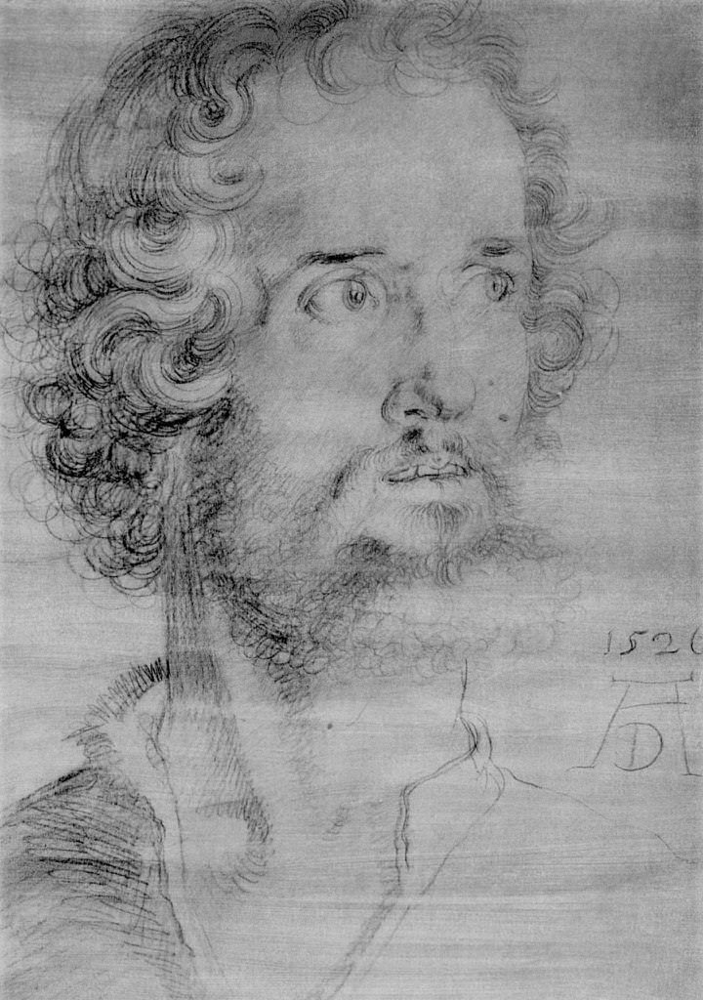

In [110]:
Image.open(f'{images_path}/Albrecht_Du╠êrer/Albrecht_Du╠êrer_1.jpg')

In [111]:
data_records = []      # Lista para guardar os dados limpos
seen_files = set()     # Conjunto para rastrear duplicatas: (label, nome_arquivo)

# Extensões válidas
valid_exts = ('.png', '.jpg', '.jpeg')

for root, _, files in os.walk(images_path):
    # Identificar o nome da pasta original
    folder_name = os.path.basename(root)
    
    # Pula a própria pasta raiz se ela aparecer no loop
    if folder_name == 'images': 
        continue

    # Normalização de Nomes (ON-THE-FLY)
    # Se começar com Albrecht_D, vira Albrecht_Durer. Senão, mantém o original.
    if folder_name.startswith("Albrecht_D"):
        label = "Albrecht_Durer"
    else:
        label = folder_name

    # Iterar arquivos e filtrar duplicatas
    for file in files:
        if file.lower().endswith(valid_exts):
            
            # Chave única: (Nome do Artista, Nome do Arquivo)
            # Ex: ('Albrecht_Durer', '1.jpg')
            unique_key = (label, file)

            if unique_key not in seen_files:
                # Se é inédito, adiciona
                seen_files.add(unique_key)
                
                # Guarda o caminho completo e o label corrigido
                full_path = os.path.join(root, file)
                data_records.append({'filepaths': full_path, 'labels': label})

In [112]:
# Criar DataFrame 
df_dataset = pd.DataFrame(data_records)

print(f"Total de imagens únicas carregadas: {len(df_dataset)}")

Total de imagens únicas carregadas: 8774


In [113]:
df_dataset.labels.unique()

array(['Albrecht_Durer', 'Alfred_Sisley', 'Amedeo_Modigliani',
       'Andrei_Rublev', 'Andy_Warhol', 'Camille_Pissarro', 'Caravaggio',
       'Claude_Monet', 'Diego_Rivera', 'Diego_Velazquez', 'Edgar_Degas',
       'Edouard_Manet', 'Edvard_Munch', 'El_Greco', 'Eugene_Delacroix',
       'Francisco_Goya', 'Frida_Kahlo', 'Georges_Seurat',
       'Giotto_di_Bondone', 'Gustave_Courbet', 'Gustav_Klimt',
       'Henri_de_Toulouse-Lautrec', 'Henri_Matisse', 'Henri_Rousseau',
       'Hieronymus_Bosch', 'Jackson_Pollock', 'Jan_van_Eyck', 'Joan_Miro',
       'Kazimir_Malevich', 'Leonardo_da_Vinci', 'Marc_Chagall',
       'Michelangelo', 'Mikhail_Vrubel', 'Pablo_Picasso', 'Paul_Cezanne',
       'Paul_Gauguin', 'Paul_Klee', 'Peter_Paul_Rubens',
       'Pierre-Auguste_Renoir', 'Pieter_Bruegel', 'Piet_Mondrian',
       'Raphael', 'Rembrandt', 'Rene_Magritte', 'Salvador_Dali',
       'Sandro_Botticelli', 'Titian', 'Vasiliy_Kandinskiy',
       'Vincent_van_Gogh', 'William_Turner'], dtype=object)

In [114]:
df_dataset.labels.nunique()

50

In [115]:
df_dataset.labels.value_counts()

labels
Vincent_van_Gogh             877
Edgar_Degas                  702
Albrecht_Durer               656
Pablo_Picasso                439
Pierre-Auguste_Renoir        336
Paul_Gauguin                 311
Francisco_Goya               291
Rembrandt                    262
Alfred_Sisley                259
Titian                       255
Marc_Chagall                 239
Rene_Magritte                194
Amedeo_Modigliani            193
Paul_Klee                    188
Henri_Matisse                186
Andy_Warhol                  181
Mikhail_Vrubel               171
Sandro_Botticelli            164
Leonardo_da_Vinci            143
Peter_Paul_Rubens            141
Salvador_Dali                139
Hieronymus_Bosch             137
Pieter_Bruegel               134
Diego_Velazquez              128
Kazimir_Malevich             126
Frida_Kahlo                  120
Giotto_di_Bondone            119
Gustav_Klimt                 117
Raphael                      109
Joan_Miro                    102
And

In [116]:
# SAMPLES_PER_CLASS = 45
# class_counts = df_dataset['labels'].value_counts()

# # Identifica artistas válidos
# valid_artists = class_counts[class_counts >= SAMPLES_PER_CLASS].index
# print(f"Artistas removidos (<{SAMPLES_PER_CLASS} imgs): {list(set(class_counts.index) - set(valid_artists))}")

# # Filtra o dataset mantendo apenas artistas válidos
# df_filtered = df_dataset[df_dataset['labels'].isin(valid_artists)].copy()

# # --- AMOSTRAGEM ESTRATIFICADA FINAL ---
# # Pega 50 de cada aleatoriamente
# df_sample = df_filtered.groupby('labels', group_keys=False).apply(
#     lambda x: x.sample(SAMPLES_PER_CLASS, random_state=42)
# )
# df_sample = df_sample.sample(frac=1, random_state=42).reset_index(drop=True)

# print("-" * 30)
# print(f"Dataset FINAL pronto para o Gemini:")
# print(f"- Total Imagens: {len(df_sample)}")
# print(f"- Artistas: {df_sample['labels'].nunique()}")
# print(f"- Imagens por Artista: {SAMPLES_PER_CLASS}")

In [117]:
# Configurações
TOP_N_CLASSES = 10
SAMPLES_PER_CLASS = 250

# 1. Conta frequências (O value_counts já retorna ordenado do maior para o menor)
class_counts = df_dataset['labels'].value_counts()

# 2. Pega apenas os Top 10 (head(10))
valid_artists = class_counts.head(TOP_N_CLASSES).index

print(f"Selecionando os Top {TOP_N_CLASSES} artistas:")
for artist in valid_artists:
    print(f"- {artist} ({class_counts[artist]} imagens originais)")

# 3. Filtra o dataset mantendo apenas esses 10 artistas
df_filtered = df_dataset[df_dataset['labels'].isin(valid_artists)].copy()

# 4. Amostragem Estratificada Final
# Pega exatamente 45 de cada um dos 10 artistas
df_sample = df_filtered.groupby('labels', group_keys=False).apply(
    lambda x: x.sample(SAMPLES_PER_CLASS, random_state=42)
)

# 5. Embaralha o resultado final
df_sample = df_sample.sample(frac=1, random_state=42).reset_index(drop=True)

print("-" * 30)
print(f"Dataset FINAL pronto para o Gemini:")
print(f"- Total Imagens: {len(df_sample)} (Esperado: {TOP_N_CLASSES * SAMPLES_PER_CLASS})")
print(f"- Artistas: {df_sample['labels'].nunique()}")
print(f"- Imagens por Artista: {SAMPLES_PER_CLASS}")

Selecionando os Top 10 artistas:
- Vincent_van_Gogh (877 imagens originais)
- Edgar_Degas (702 imagens originais)
- Albrecht_Durer (656 imagens originais)
- Pablo_Picasso (439 imagens originais)
- Pierre-Auguste_Renoir (336 imagens originais)
- Paul_Gauguin (311 imagens originais)
- Francisco_Goya (291 imagens originais)
- Rembrandt (262 imagens originais)
- Alfred_Sisley (259 imagens originais)
- Titian (255 imagens originais)
------------------------------
Dataset FINAL pronto para o Gemini:
- Total Imagens: 2500 (Esperado: 2500)
- Artistas: 10
- Imagens por Artista: 250


C:\Users\laris\AppData\Local\Temp\ipykernel_14888\570720193.py:20: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_sample = df_filtered.groupby('labels', group_keys=False).apply(


In [118]:
df_dataset

,filepaths,labels
0,F:\laris\Documents\Proj_Orientado\data\dataset...,Albrecht_Durer
1,F:\laris\Documents\Proj_Orientado\data\dataset...,Albrecht_Durer
2,F:\laris\Documents\Proj_Orientado\data\dataset...,Albrecht_Durer
3,F:\laris\Documents\Proj_Orientado\data\dataset...,Albrecht_Durer
4,F:\laris\Documents\Proj_Orientado\data\dataset...,Albrecht_Durer
...,...,...
8769,F:\laris\Documents\Proj_Orientado\data\dataset...,William_Turner
8770,F:\laris\Documents\Proj_Orientado\data\dataset...,William_Turner
8771,F:\laris\Documents\Proj_Orientado\data\dataset...,William_Turner
8772,F:\laris\Documents\Proj_Orientado\data\dataset...,William_Turner


In [119]:
df_sample

,filepaths,labels
0,F:\laris\Documents\Proj_Orientado\data\dataset...,Paul_Gauguin
1,F:\laris\Documents\Proj_Orientado\data\dataset...,Pablo_Picasso
2,F:\laris\Documents\Proj_Orientado\data\dataset...,Pablo_Picasso
3,F:\laris\Documents\Proj_Orientado\data\dataset...,Vincent_van_Gogh
4,F:\laris\Documents\Proj_Orientado\data\dataset...,Pierre-Auguste_Renoir
...,...,...
2495,F:\laris\Documents\Proj_Orientado\data\dataset...,Pierre-Auguste_Renoir
2496,F:\laris\Documents\Proj_Orientado\data\dataset...,Pablo_Picasso
2497,F:\laris\Documents\Proj_Orientado\data\dataset...,Pablo_Picasso
2498,F:\laris\Documents\Proj_Orientado\data\dataset...,Paul_Gauguin


In [120]:
classes = df_sample['labels'].unique()
num_classes = len(classes)
print(f"Total de classes encontradas: {num_classes}")
print(f'Nomes das classes: {classes}')

Total de classes encontradas: 10
Nomes das classes: ['Paul_Gauguin' 'Pablo_Picasso' 'Vincent_van_Gogh' 'Pierre-Auguste_Renoir'
 'Edgar_Degas' 'Alfred_Sisley' 'Albrecht_Durer' 'Francisco_Goya' 'Titian'
 'Rembrandt']


In [121]:
def visualizar_grid_dinamico(df, qtd_classes_y, qtd_imagens_x):
    """
    Plota um grid de imagens aleatórias do DataFrame.
    
    Args:
        df: DataFrame contendo 'filepaths' e 'labels'.
        qtd_classes_y: Número de classes (linhas) para mostrar.
        qtd_imagens_x: Número de imagens por classe (colunas).
    """
    
    # 1. Identificar todas as classes únicas disponíveis
    all_classes = df['labels'].unique()
    
    # Garante que não vamos pedir mais classes do que existem
    qtd_classes_y = min(qtd_classes_y, len(all_classes))
    
    # 2. Selecionar aleatoriamente quais classes (artistas) vamos mostrar
    selected_classes = random.sample(list(all_classes), k=qtd_classes_y)
    
    # 3. Configurar a Figura
    # squeeze=False é CRUCIAL: garante que 'axes' seja sempre uma matriz 2D [linhas, colunas],
    # mesmo que seja apenas 1 linha ou 1 coluna.
    fig, axes = plt.subplots(nrows=qtd_classes_y, 
                             ncols=qtd_imagens_x, 
                             figsize=(qtd_imagens_x * 3, qtd_classes_y * 3.5), # Tamanho dinâmico
                             squeeze=False) 

    fig.suptitle(f'Amostra: {qtd_classes_y} Artistas x {qtd_imagens_x} Obras', fontsize=20, y=1.01)

    # 4. Loop das Classes (Linhas)
    for i, label in enumerate(selected_classes):
        
        # Filtra e pega amostra aleatória para aquela classe
        # replace=True evita erro se alguma classe tiver menos imagens que o solicitado (improvável, mas seguro)
        class_samples = df[df['labels'] == label].sample(n=qtd_imagens_x, replace=True)
        
        # Define o título da linha (Nome do Artista) na primeira coluna
        # Rotation=0 e labelpad garantem que nomes longos não fiquem sobre a imagem
        axes[i, 0].set_ylabel(label, rotation=0, size='large', labelpad=60, ha='right', va='center')

        # 5. Loop das Imagens (Colunas)
        for j, (_, row) in enumerate(class_samples.iterrows()):
            img_path = row['filepaths']
            
            try:
                img = Image.open(img_path)
                ax = axes[i, j]
                ax.imshow(img)
            except Exception as e:
                print(f"Erro ao abrir {img_path}: {e}")
            
            # Limpeza visual
            ax = axes[i, j] # Garante referência
            ax.set_xticks([]) 
            ax.set_yticks([])
            
            # (Opcional) Título da coluna apenas na primeira linha
            if i == 0:
                ax.set_title(f"Amostra {j+1}")

    plt.tight_layout()
    plt.savefig(f"{OUTPUT_DIR}/amostra_dados.png")
    plt.show()

Gerando grid 5 x 4...


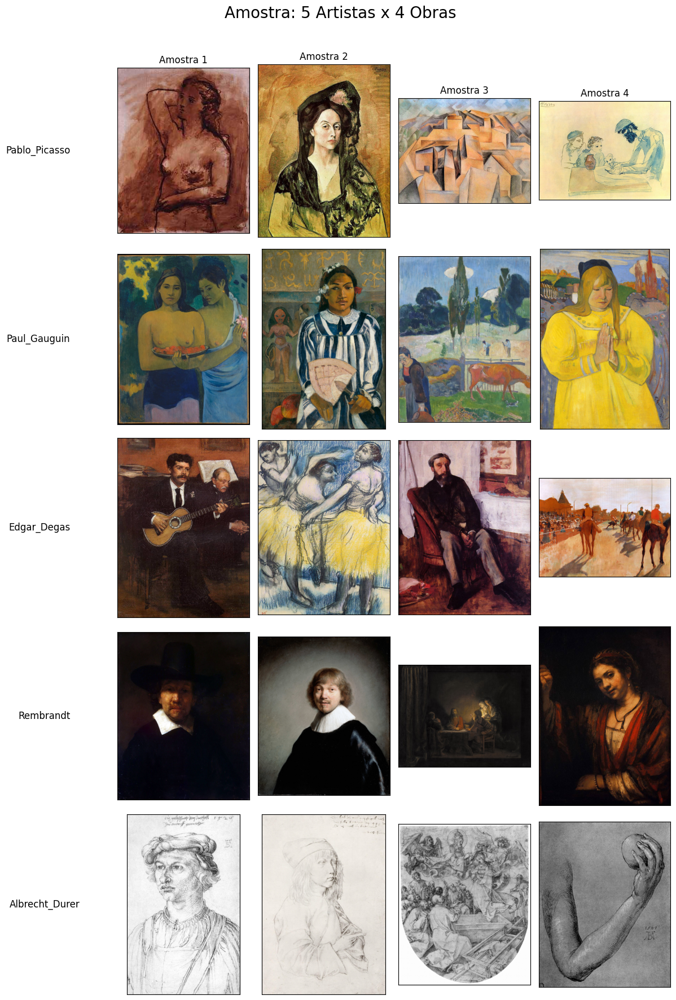

In [122]:
qtd_classes, qtd_imagens = 5, 4
print(f"Gerando grid { qtd_classes} x {qtd_imagens}...")
visualizar_grid_dinamico(df_sample, qtd_classes, qtd_imagens)

# Saída estruturada com Gemini

In [123]:
for model in genai.list_models():
    print(model.name)

models/embedding-gecko-001
models/gemini-2.5-pro-preview-03-25
models/gemini-2.5-flash
models/gemini-2.5-pro-preview-05-06
models/gemini-2.5-pro-preview-06-05
models/gemini-2.5-pro
models/gemini-2.0-flash-exp
models/gemini-2.0-flash
models/gemini-2.0-flash-001
models/gemini-2.0-flash-exp-image-generation
models/gemini-2.0-flash-lite-001
models/gemini-2.0-flash-lite
models/gemini-2.0-flash-lite-preview-02-05
models/gemini-2.0-flash-lite-preview
models/gemini-2.0-pro-exp
models/gemini-2.0-pro-exp-02-05
models/gemini-exp-1206
models/gemini-2.0-flash-thinking-exp-01-21
models/gemini-2.0-flash-thinking-exp
models/gemini-2.0-flash-thinking-exp-1219
models/gemini-2.5-flash-preview-tts
models/gemini-2.5-pro-preview-tts
models/learnlm-2.0-flash-experimental
models/gemma-3-1b-it
models/gemma-3-4b-it
models/gemma-3-12b-it
models/gemma-3-27b-it
models/gemma-3n-e4b-it
models/gemma-3n-e2b-it
models/gemini-flash-latest
models/gemini-flash-lite-latest
models/gemini-pro-latest
models/gemini-2.5-flash-l

In [124]:
model = genai.GenerativeModel(
    model_name="gemini-2.5-flash",
    system_instruction="""
    You are an expert Art Historian and Curator.
    Your task is to analyze paintings and attribute them to the correct artist based on style, technique, and subject matter.
    """
)

In [125]:
# model

In [126]:
# Image.open(df_sample.filepaths.iloc[0])

In [127]:
artist_list = df_sample['labels'].unique().tolist()
artist_list_str = ", ".join(artist_list)\

class Art_Classification(BaseModel):
    class_prediction: str # "Name of the artist strictly from the provided list"
    reasoning: str
    art_movement: str # Campo extra: qual o movimento (Impressionismo, etc)?

prompt = f"""
    Analyze this painting carefully.
    Identify the artist who created this work.
    
    You must choose ONE artist from this list:
    [{artist_list_str}]

    Analyze the brushwork, color palette, lighting, and composition to justify your choice.
"""

In [128]:
os.path.basename(os.path.dirname(df_sample.filepaths.values[0]))

'Paul_Gauguin'

In [129]:
y_true = []
y_pred = []
full_data = []

for image_path in tqdm(df_sample.filepaths.values, desc="Processing Images"):
    try:
        # Ground Truth
        true_label_str = os.path.basename(os.path.dirname(image_path))
        if true_label_str.startswith("Albrecht_D"):
            true_label_str = "Albrecht_Durer"

        # Predição
        img = Image.open(image_path)
        response = model.generate_content(
        contents=[prompt, img],
            generation_config={
                "response_mime_type": "application/json",
                "response_schema": Art_Classification,
            },
        )

        try:
            json_dict = json.loads(response.text)
            # print(json_dict)
            
            # prediction = Art_Classification(**json_dict)
            # print(prediction)
        except Exception as e:
            print(f"Erro ao converter JSON da imagem {os.path.basename(image_path)}: {e}\njson recebido: {json_dict}")
            continue
        # ---------------------

        pred_label_str = json_dict["class_prediction"]
        reason = json_dict["reasoning"]
        movement = json_dict["art_movement"]
        
        # Armazenamento
        y_true.append(true_label_str)
        y_pred.append(pred_label_str)

        full_data.append({
            "image_name": os.path.basename(image_path),
            "true_label": true_label_str,
            "pred_label": pred_label_str,
            "is_correct": true_label_str == pred_label_str,
            "reasoning": reason,
            "art_movement": movement
        })

        time.sleep(2)

    except Exception as e:
        print(f"Error on {image_path}: {e}")

Processing Images:  39%|███▉      | 986/2500 [3:11:02<3:58:16,  9.44s/it]

Erro ao converter JSON da imagem Titian_185.jpg: Invalid operation: The `response.parts` quick accessor requires a single candidate, but but `response.candidates` is empty.
This appears to be caused by a blocked prompt, see `response.prompt_feedback`: block_reason: OTHER

json recebido: {'art_movement': 'Early Modernism (Blue Period)', 'class_prediction': 'Pablo_Picasso', 'reasoning': "This painting exhibits several key characteristics indicative of Pablo Picasso's early work, specifically from his Blue Period or the period immediately preceding it, around 1901-1903. The most striking features are the use of non-naturalistic colors, particularly the greens and blues in the facial shadows, which create a stark contrast with the warm ochre background and the more naturalistic skin tones. This color choice, though unconventional, effectively models the form and conveys a sense of melancholy or introspection, a recurring theme in Picasso's Blue Period. The brushwork is visible and direct, 

Processing Images:  99%|█████████▉| 2474/2500 [8:04:23<03:48,  8.79s/it]  

Erro ao converter JSON da imagem Pablo_Picasso_88.jpg: Invalid operation: The `response.parts` quick accessor requires a single candidate, but but `response.candidates` is empty.
This appears to be caused by a blocked prompt, see `response.prompt_feedback`: block_reason: OTHER

json recebido: {'art_movement': 'High Renaissance (Venetian School)', 'class_prediction': 'Titian', 'reasoning': "The painting exhibits hallmarks of Titian's style and the Venetian High Renaissance. The subject matter, 'Venus and Adonis,' is one that Titian painted multiple times, exploring mythological narratives with great sensuality and dramatic flair. The brushwork, particularly in the rendering of the figures' flesh, is smooth and idealized, while the surrounding landscape and drapery show a more painterly quality characteristic of Titian's developing technique. The color palette is exceptionally rich and vibrant, with luminous flesh tones and deep reds, demonstrating Titian's mastery of 'colore.' The light

Processing Images: 100%|██████████| 2500/2500 [8:09:24<00:00, 11.75s/it]


In [130]:
# DataFrame Principal
df_results = pd.DataFrame(full_data)
df_results

,image_name,true_label,pred_label,is_correct,reasoning,art_movement
0,Paul_Gauguin_253.jpg,Paul_Gauguin,Alfred_Sisley,False,The painting exhibits hallmarks of Impressioni...,Impressionism
1,Pablo_Picasso_153.jpg,Pablo_Picasso,Pablo_Picasso,True,The painting 'Acrobate and Young Harlequin' or...,Rose Period
2,Pablo_Picasso_356.jpg,Pablo_Picasso,Pablo_Picasso,True,The painting 'Boy with a Harlequin' is a quint...,Rose Period
3,Vincent_van_Gogh_162.jpg,Vincent_van_Gogh,Vincent_van_Gogh,True,The painting exhibits hallmarks characteristic...,Post-Impressionism (early Dutch period)
4,Pierre-Auguste_Renoir_35.jpg,Pierre-Auguste_Renoir,Pierre-Auguste_Renoir,True,"The painting exhibits a loose, expressive brus...",Post-Impressionism
...,...,...,...,...,...,...
2493,Pierre-Auguste_Renoir_323.jpg,Pierre-Auguste_Renoir,Pierre-Auguste_Renoir,True,The painting exhibits characteristic traits of...,Impressionism
2494,Pablo_Picasso_70.jpg,Pablo_Picasso,Pablo_Picasso,True,The painting exhibits hallmarks of Pablo Picas...,Post-Impressionism
2495,Pablo_Picasso_410.jpg,Pablo_Picasso,Pablo_Picasso,True,The painting exhibits a powerful simplificatio...,Proto-Cubism / African Period
2496,Paul_Gauguin_89.jpg,Paul_Gauguin,Paul_Gauguin,True,The painting strongly exhibits characteristics...,Post-Impressionism / Symbolism


In [131]:
df_results['true_label'].unique()

array(['Paul_Gauguin', 'Pablo_Picasso', 'Vincent_van_Gogh',
       'Pierre-Auguste_Renoir', 'Edgar_Degas', 'Alfred_Sisley',
       'Albrecht_Durer', 'Francisco_Goya', 'Titian', 'Rembrandt'],
      dtype=object)

In [132]:
# Localiza onde começa com 'Albrecht_D' e define o valor diretamente
mask = df_results['true_label'].str.startswith('Albrecht_D', na=False)
df_results.loc[mask, 'true_label'] = 'Albrecht_Durer'

In [133]:
df_results['true_label'].unique()

array(['Paul_Gauguin', 'Pablo_Picasso', 'Vincent_van_Gogh',
       'Pierre-Auguste_Renoir', 'Edgar_Degas', 'Alfred_Sisley',
       'Albrecht_Durer', 'Francisco_Goya', 'Titian', 'Rembrandt'],
      dtype=object)

In [134]:
# Salvar parquet Completo
parquet_path = os.path.join(OUTPUT_DIR, "classifications_results.parquet")
df_results.to_parquet(parquet_path, index=False)
print(f"- parquet completo salvo em: {parquet_path}")

# # Salvar CSV Completo (Mais estável que Parquet neste caso)
# csv_path = os.path.join(OUTPUT_DIR, "classifications_results.csv")
# df_results.to_csv(csv_path, index=False)
# print(f"- CSV completo salvo em: {csv_path}")

- parquet completo salvo em: F:\laris\Documents\Proj_Orientado\results\top_10_artists\all_data\classifications_results.parquet


In [135]:
y_true = df_results["true_label"].values
y_pred = df_results["pred_label"].values

In [136]:
# Salvar Relatório de Métricas (Texto)
report_path = os.path.join(OUTPUT_DIR, "metrics_report.txt")
acc = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='micro', zero_division=0)
recall = recall_score(y_true, y_pred, average='micro', zero_division=0)
f1_micro = f1_score(y_true, y_pred, average='micro', zero_division=0)
f1_macro = f1_score(y_true, y_pred, average='macro', zero_division=0)

report_str = classification_report(y_true, y_pred, target_names=df_results['true_label'].unique())

with open(report_path, "w",encoding="utf-8") as f:
    f.write("=== RELATÓRIO DE EXPERIMENTO AUTOMATIZADO ===\n")
    f.write(f"Total de Imagens: {len(df_results)}\n")
    f.write(f"Acurácia: {acc:.4f} ({acc:.2%})\n\n")
    f.write(f"Precisão: {precision:.4f} ({precision:.2%})\n\n")
    f.write(f"Recall: {recall:.4f} ({recall:.2%})\n\n")
    f.write(f"F1 micro: {f1_micro:.4f} ({f1_micro:.2%})\n\n")
    f.write(f"F1 macro: {f1_macro:.4f} ({f1_macro:.2%})\n\n")
    f.write("--- Detalhes por Classe ---\n")
    f.write(report_str)

print(f"- Relatório de texto salvo em: {report_path}")

- Relatório de texto salvo em: F:\laris\Documents\Proj_Orientado\results\top_10_artists\all_data\metrics_report.txt


- Imagem da matriz salva em: F:\laris\Documents\Proj_Orientado\results\top_10_artists\all_data\confusion_matrix.png


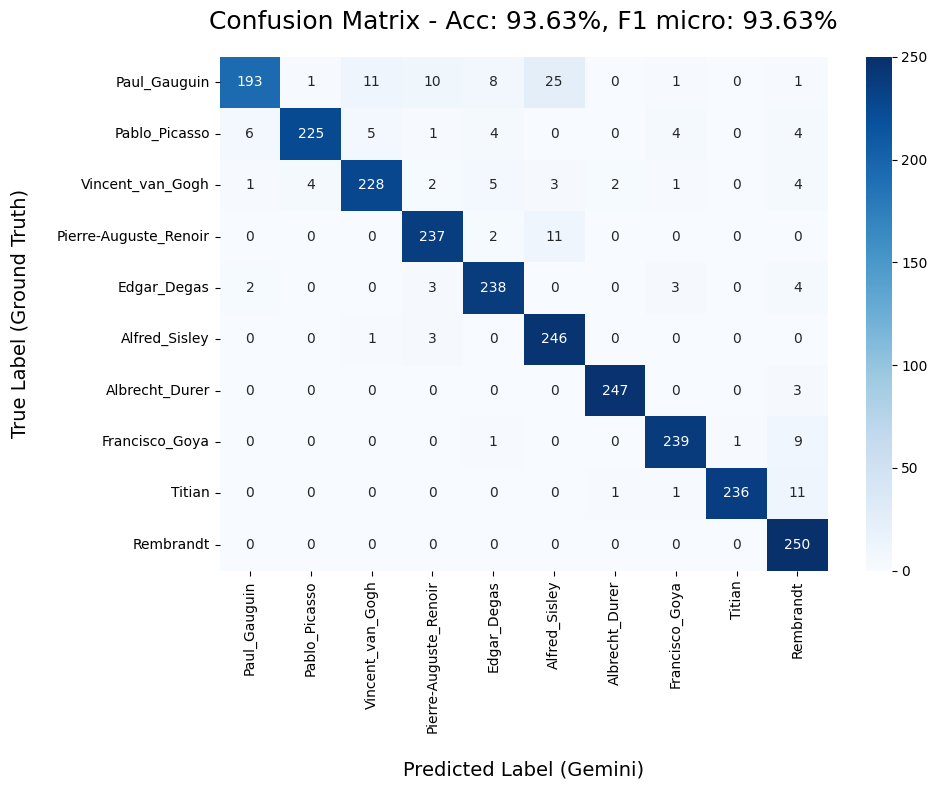

In [142]:
# D. Gerar e Salvar Matriz de Confusão (Imagem)
# labels_list = [l.value for l in Labels]
cm = confusion_matrix(y_true, y_pred, labels=artist_list)

plt.figure(figsize=(10, 8))
# plt.figure(figsize=(24, 20))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=artist_list,
            yticklabels=artist_list,
            # annot_kws={"size": 18}
            )
plt.xlabel('Predicted Label (Gemini)', fontsize=14, labelpad=20)
plt.ylabel('True Label (Ground Truth)', fontsize=14, labelpad=20)
plt.title(f'Confusion Matrix - Acc: {acc:.2%}, F1 micro: {f1_micro:.2%}', fontsize=18, pad=20)
plt.tight_layout()

# Salva a figura ANTES de exibir
plot_path = os.path.join(OUTPUT_DIR, "confusion_matrix.png")
plt.savefig(plot_path, dpi=300) # dpi=300 garante alta resolução para o artigo
print(f"- Imagem da matriz salva em: {plot_path}")
plt.show()

- Imagem da matriz normalizada salva em: F:\laris\Documents\Proj_Orientado\results\top_10_artists\all_data\confusion_matrix_normalized.png


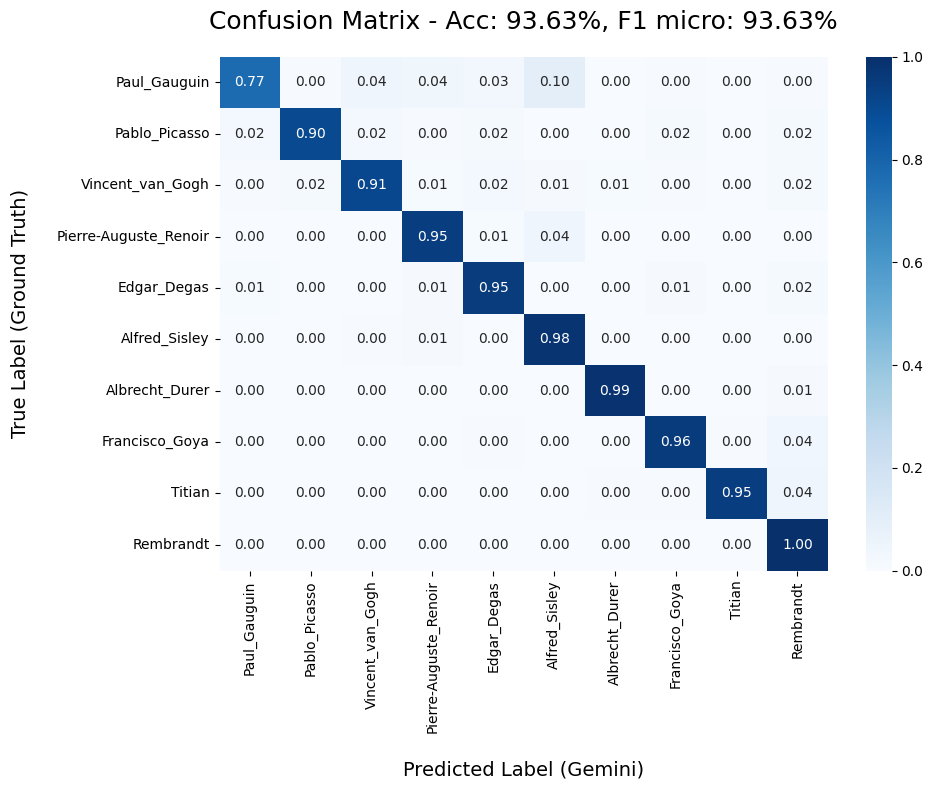

In [143]:
# D. Gerar e Salvar Matriz de Confusão Normalizada (Imagem)
cm_norm = confusion_matrix(y_true, y_pred, labels=artist_list, normalize='true')

plt.figure(figsize=(10, 8))
# plt.figure(figsize=(24, 20))
sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=artist_list,
            yticklabels=artist_list,
            # annot_kws={"size": 12}
            )
plt.xlabel('Predicted Label (Gemini)', fontsize=14, labelpad=20)
plt.ylabel('True Label (Ground Truth)', fontsize=14, labelpad=20)
plt.title(f'Confusion Matrix - Acc: {acc:.2%}, F1 micro: {f1_micro:.2%}', fontsize=18, pad=20)
plt.tight_layout()

# Salva a figura ANTES de exibir
plot_path = os.path.join(OUTPUT_DIR, "confusion_matrix_normalized.png")
plt.savefig(plot_path, dpi=300) # dpi=300 garante alta resolução para o artigo
print(f"- Imagem da matriz normalizada salva em: {plot_path}")
plt.show()

# Novo Dataset

In [139]:
%cd {BASE_DIR}

F:\laris\Documents\Proj_Orientado\data


f:\laris\Documents\Proj_Orientado\.venv\lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [140]:
# Caminho da pasta de saída
output_folder = f'acervo_top_{TOP_N_CLASSES}_artistas_classificado'
if os.path.exists(output_folder):
    shutil.rmtree(output_folder) # Limpa execuções anteriores
os.makedirs(output_folder, exist_ok=True)

print(f"\nOrganizando as imagens no acervo digital em '{output_folder}'...")

# 1. Criar uma gaveta (pasta) para cada categoria
for label in df_results['pred_label'].unique():
    label_path = os.path.join(output_folder, label)
    os.makedirs(label_path, exist_ok=True)

# 2. Arquivar cada imagem na sua respectiva gaveta
for index, row in tqdm(df_results.iterrows(), total=df_results.shape[0], desc="Arquivando Imagens"):
    image_name = row['image_name']
    label = row['pred_label']

    # Encontra o caminho original da imagem
    source_path = next((path for path in df_sample.filepaths.values if image_name in path), None)

    if source_path:
        destination_path = os.path.join(output_folder, label, image_name)
        shutil.copy(source_path, destination_path)

print("\nAcervo biológico organizado com sucesso!")


Organizando as imagens no acervo digital em 'acervo_top_10_artistas_classificado'...


Arquivando Imagens:   0%|          | 0/2498 [00:00<?, ?it/s]

Arquivando Imagens: 100%|██████████| 2498/2498 [00:09<00:00, 256.85it/s]


Acervo biológico organizado com sucesso!


Classes encontradas: ['Albrecht_Durer', 'Alfred_Sisley', 'Edgar_Degas', 'Francisco_Goya', 'Pablo_Picasso', 'Paul_Gauguin', 'Pierre-Auguste_Renoir', 'Rembrandt', 'Titian', 'Vincent_van_Gogh']


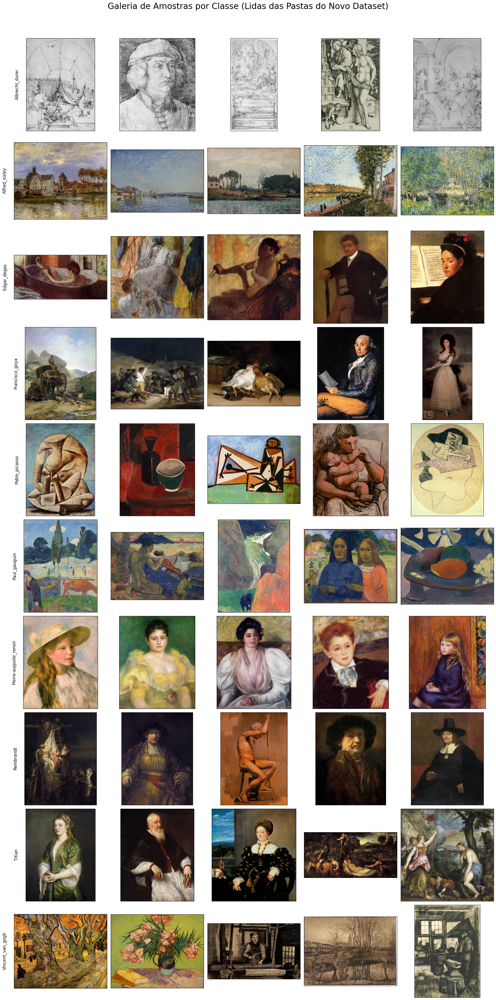

In [141]:
# Obtém os nomes das classes diretamente das subpastas
# Filtra para garantir que estamos pegando apenas diretórios
class_names = sorted([d for d in os.listdir(output_folder) if os.path.isdir(os.path.join(output_folder, d))])
num_classes = len(class_names)
print(f"Classes encontradas: {class_names}")

# Definir o número de imagens por classe e o layout do grid
num_images_per_class = 5
cols = num_images_per_class
rows = num_classes

# Cria a figura e os eixos (subplots)
fig, axes = plt.subplots(nrows=rows,
                         ncols=cols,
                         figsize=(20, rows * 4)) # A altura se ajusta ao número de classes

# Título geral para a galeria
fig.suptitle('Galeria de Amostras por Classe (Lidas das Pastas do Novo Dataset)', fontsize=24, y=1.0)

# Itera sobre cada classe para preencher uma linha da galeria
for i, class_name in enumerate(class_names):

    # --- LÓGICA ADAPTADA ---
    # 1. Monta o caminho para a pasta da classe atual
    class_folder = os.path.join(output_folder, class_name)

    # 2. Lista todas as imagens nessa pasta
    image_filenames = os.listdir(class_folder)

    # 3. Escolhe 5 imagens aleatoriamente (usamos 'choices' para permitir reposição se houver menos de 5)
    sampled_images = random.choices(image_filenames, k=num_images_per_class)

    # Define o nome da classe como um título para a linha (no primeiro subplot da linha)
    # A rotação 90 (vertical) economiza espaço e é mais comum para títulos de eixo Y
    axes[i, 0].set_ylabel(class_name.capitalize(), rotation=90, size='large', labelpad=20)

    # Itera sobre as imagens amostradas para plotá-las na linha
    for j, image_name in enumerate(sampled_images):
        # Monta o caminho completo para a imagem
        img_path = os.path.join(class_folder, image_name)
        img = Image.open(img_path)

        # Seleciona o eixo (subplot) correto e plota a imagem
        ax = axes[i, j]
        ax.imshow(img)
        ax.set_xticks([]) # Remove marcações do eixo X
        ax.set_yticks([]) # Remove marcações do eixo Y

# Ajusta o layout para evitar sobreposição de títulos e imagens
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()